## Load Libraries

In [ ]:
!pip install -q transformers==4.36.0
!pip install -q bitsandbytes==0.41.3 accelerate==0.26.0
!pip install -q -U sentence-transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.8/126.8 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 89.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 3.2.1 requires transformers<5.0.0,>=4.41.0, but you have transformers 4.36.0 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.6/92.6 MB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.7/270.7 kB 22.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 111.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 95.1 MB/s e

In [ ]:
!pip install -q -U sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 4.1 MB/s eta 0:00:00


In [ ]:
from sentence_transformers import SentenceTransformer
from sklearn.neighbors import NearestNeighbors

In [ ]:
import numpy as np
from PIL import Image
# import uuid
import json
import os
from pprint import pprint
import random
import requests
from io import BytesIO
import pickle
import pandas as pd
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
import torch
from transformers import AutoProcessor, LlavaForConditionalGeneration
from sentence_transformers import SentenceTransformer
from sklearn.neighbors import NearestNeighbors

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
test_im_file_path = '/content/drive/My Drive/capstone_personal/test_images/cardboard_box/IMG_8319.png'
test_im_file_path = '/content/drive/My Drive/capstone_personal/test_images/cardboard_box/IMG_8271.jpg'
# os.listdir()

## Training Data

In [ ]:
## load RAG files

with open('/content/drive/My Drive/capstone_personal/rag_files/instructions.json', 'r') as openfile:

    recycling_instructions_open = json.load(openfile)

with open('/content/drive/My Drive/capstone_personal/rag_files/names_reference_list', 'rb') as dict_file:
    rag_embeddings = pickle.load(dict_file)

with open('/content/drive/My Drive/capstone_personal/rag_files/locations_idx_list', 'rb') as loc_dict_file:
    locations_json_idx_dict = pickle.load(loc_dict_file)

instruct_mapping_csv = pd.read_csv("/content/drive/My Drive/capstone_personal/rag_files/instruction_mapping_df.csv")

In [ ]:
# true class ids for stage 1 - based off of assigned class labels on embeddings words list (see rag files)
class_ref_dict = {'boxes':4,
                  'glass_bottle':5,
                  'soda_can':2,
                  'aluminum_can':1,
                  'paper_cup':3,
                  'plastic_bottle':6,
                  'others':13}

In [ ]:
# table created for true values for stage 2
classes_col = np.repeat(np.arange(0, 14), 2)
loc_name = np.tile(['Cook County, IL', 'Palm Desert, CA'], 14)
loc_idx = np.tile([1, 2], 14)
recycling_generic_names = np.repeat(['aluminum can', 'metal food can', 'beverage can', 'disposable cup', 'cardboard box',
                                     'glass bottle', 'plastic bottle', 'plastic cup', 'plastic bag', 'plastic jug', 'plastic takeout container',
                                     'styrofoam food container', 'styrofoam packing block', 'other'], 2)
recyclability = ['yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'no', 'no','yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'no', 'no', 'no', 'no',
                 'yes', 'yes', 'no', 'no', 'no', 'no', 'no', 'yes', 'no', 'no']

s2_answers_df= pd.DataFrame({'class': classes_col, 'location': loc_name, 'location_id': loc_idx, 'generic names': recycling_generic_names, 'recyclability': recyclability})
s2_answers_df

In [ ]:
def retrive_instruct(class_choice, stage_1_output, location_name, recycling_instruction_dataset, locations_dict, instruc_mapping_df):

  locations_list = [x['location_id'] for x in recycling_instruction_dataset]

  loc_num = locations_dict[location_name]

  loc_idx = locations_list.index(loc_num)

  loc_dict = recycling_instruction_dataset[loc_idx]

  instructions_dict_list = loc_dict['instructions']


  relevant_sec_id = instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['instruction_id'].values[0]
  stage_3_name =  instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['generic names'].values[0]

  if stage_3_name == 'other':
    stage_3_name = stage_1_output

  instruc_id_list = [x['instruc_id'] for x in instructions_dict_list]

  instruc_idx = instruc_id_list.index(relevant_sec_id)

  retrieve_instruc = instructions_dict_list[instruc_idx]['instructions']

  return retrieve_instruc, stage_3_name

def knn_rag(stage_1_output, location, embeddings_cluster_dict, encoder_model):

  reference_words_list = list(embeddings_cluster_dict.keys())
  # encoder_model = SentenceTransformer('sentence-transformers/LaBSE')
  reference_embeddings = encoder_model.encode(reference_words_list)

  knn_model = NearestNeighbors(n_neighbors=1)
  knn_model.fit(reference_embeddings)

  query_phrase = stage_1_output.lower().strip(" .")

  query_llava = encoder_model.encode(query_phrase)

  dists, idxs = knn_model.kneighbors([query_llava])

  # print(idxs)
  neighbor = reference_words_list[idxs[0][0]]

  distance = dists[0]

  if distance <0.70:
    class_num = embeddings_cluster_dict[neighbor]
  else:
    class_num = 7

  instruction, stage_3_name = retrive_instruct(class_num, stage_1_output, location, recycling_instructions_open, locations_json_idx_dict, instruct_mapping_csv)

  return class_num, instruction, stage_3_name


def run_model(input_img, loc, processor, model, encoder_model):

  prompt = f"USER: <image>\nWhat is this waste item, what is it made of and primarily used for, don't consider the brand, output a one phrase answer\nASSISTANT:"

  inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

  output = model.generate(**inputs, max_new_tokens=25, do_sample=False, temperature = 0)

  output_str = processor.decode(output[0][2:], skip_special_tokens=True)

  output_idx = output_str.index("ASSISTANT") + 11
  stage_1 = output_str[output_idx:]

  class_num, instruction, stage_3_name = knn_rag(stage_1, loc, rag_embeddings, encoder_model)

  prompt = f"USER: <image>\n Given these instructions: {instruction}. Is {stage_1} in the image recyclable Choose yes or no\nASSISTANT:"

  inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

  output = model.generate(**inputs, max_new_tokens=5, do_sample=False, temperature = 0)

  output_str = processor.decode(output[0][2:], skip_special_tokens=True)

  output_idx = output_str.index("ASSISTANT") + 11
  stage_2 = output_str[output_idx:]

  prompt = prompt = f"""USER: <image>\n Write recycling instructions based upon the following information about local recycling: {instruction}. Is this item able to be reyclced: {stage_2}. The descriptive name for the item is {stage_1}.
  State in full sentences if this specific item can be recycled. Please provide instructions for how to recycle, create bulleted list instructions if it is recyclable, limit the answer to 3 sentences.\nASSISTANT:"""

  inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

  output = model.generate(**inputs, max_new_tokens=150, do_sample=False, temperature = 0)

  output_str = processor.decode(output[0][2:], skip_special_tokens=True)

  output_idx = output_str.index("ASSISTANT") + 11
  stage_3 = output_str[output_idx:]

  return stage_3_name, instruction, stage_3


# loc_option = "Palm Desert"
# image_arr = np.load("/content/drive/My Drive/capstone_project/image_data/data_x.npy", allow_pickle = True)
# image_to_display = Image.fromarray(np.uint8(image_arr[20]))

# model_output = run_model(image_to_display, loc_option)
# print(model_output)

In [ ]:
model_id = "llava-hf/llava-1.5-7b-hf"

processor = AutoProcessor.from_pretrained(model_id)

model = LlavaForConditionalGeneration.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    low_cpu_mem_usage=True,
    load_in_4bit=True
  )

In [ ]:
encoder_model = SentenceTransformer('sentence-transformers/LaBSE')

In [ ]:
# RAG like backend

def retrive_instruct(class_choice, stage_1_output, location_name, recycling_instruction_dataset, locations_dict, instruc_mapping_df):

  locations_list = [x['location_id'] for x in recycling_instruction_dataset]

  loc_num = locations_dict[location_name]

  loc_idx = locations_list.index(loc_num)

  loc_dict = recycling_instruction_dataset[loc_idx]

  instructions_dict_list = loc_dict['instructions']


  relevant_sec_id = instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['instruction_id'].values[0]
  stage_3_name =  instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['generic names'].values[0]

  if stage_3_name == 'other':
    stage_3_name = stage_1_output

  instruc_id_list = [x['instruc_id'] for x in instructions_dict_list]

  instruc_idx = instruc_id_list.index(relevant_sec_id)

  retrieve_instruc = instructions_dict_list[instruc_idx]['instructions']

  return retrieve_instruc, stage_3_name

def knn_rag(stage_1_output, location, embeddings_cluster_dict, encoder_model):

  reference_words_list = list(embeddings_cluster_dict.keys())
  # encoder_model = SentenceTransformer('sentence-transformers/LaBSE')
  reference_embeddings = encoder_model.encode(reference_words_list)

  knn_model = NearestNeighbors(n_neighbors=1)
  knn_model.fit(reference_embeddings)

  query_phrase = stage_1_output.lower().strip(". ")

  query_llava = encoder_model.encode(query_phrase)

  dists, idxs = knn_model.kneighbors([query_llava])

  # print(idxs)
  neighbor = reference_words_list[idxs[0][0]]

  distance = dists[0]

  if distance <0.70:
    class_num = embeddings_cluster_dict[neighbor]
  else:
    class_num = 7

  instruction, stage_3_name = retrive_instruct(class_num, stage_1_output, location, recycling_instructions_open, locations_json_idx_dict, instruct_mapping_csv)

  return class_num, instruction, stage_3_name

In [ ]:
def correct_instruction_retrieve(class_choice, location_name, locations_dict, recycling_instruction_dataset, instruc_mapping_df):
  locations_list = [x['location_id'] for x in recycling_instruction_dataset]

  loc_num = locations_dict[location_name]

  loc_idx = locations_list.index(loc_num)

  loc_dict = recycling_instruction_dataset[loc_idx]

  instructions_dict_list = loc_dict['instructions']


  relevant_sec_id = instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['instruction_id'].values[0]

  instruc_id_list = [x['instruc_id'] for x in instructions_dict_list]

  instruc_idx = instruc_id_list.index(relevant_sec_id)

  retrieve_instruc = instructions_dict_list[instruc_idx]['instructions']

  return retrieve_instruc


In [ ]:
def run_stage_1(input_img, loc, processor, model, encoder_model):

  prompt = f"USER: <image>\nWhat is this waste item, what is it made of and primarily used for, don't consider the brand, output a short one phrase answer\nASSISTANT:"

  inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

  output = model.generate(**inputs, max_new_tokens=25, do_sample=False, temperature = 0)

  output_str = processor.decode(output[0][2:], skip_special_tokens=True)

  output_idx = output_str.index("ASSISTANT") + 11
  stage_1 = output_str[output_idx:]

  class_num, instruction, stage_3_name = knn_rag(stage_1, loc, rag_embeddings, encoder_model)

  return class_num

In [ ]:
def run_stage_2(input_img, loc, processor, model, stage_1, class_num):

  instruction = correct_instruction_retrieve(class_num, loc, locations_json_idx_dict, recycling_instructions_open, instruct_mapping_csv)

  prompt = f"USER: <image>\n Given these instructions: {instruction}. Is {stage_1} in the image recyclable Choose yes or no\nASSISTANT:"

  inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

  output = model.generate(**inputs, max_new_tokens=5, do_sample=False, temperature = 0)

  output_str = processor.decode(output[0][2:], skip_special_tokens=True)

  output_idx = output_str.index("ASSISTANT") + 11
  stage_2 = output_str[output_idx:]

  return stage_2

In [ ]:
def run_stage_3(input_img, loc, processor, model, stage_1, stage_2):

  instruction = correct_instruction_retrieve(class_num, loc, locations_json_idx_dict, recycling_instructions_open, instruct_mapping_csv)

  prompt = prompt = f"""USER: <image>\n Write recycling instructions based upon the following information about local recycling: {instruction}. Is this item able to be reyclced: {stage_2}. The descriptive name for the item is {stage_1}.
State in full sentences if this specific item can be recycled. Please provide instructions for how to recycle, create bulleted list instructions if it is recyclable, limit the answer to 3 sentences.\nASSISTANT:"""

  inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

  output = model.generate(**inputs, max_new_tokens=150, do_sample=False, temperature = 0)

  output_str = processor.decode(output[0][2:], skip_special_tokens=True)

  output_idx = output_str.index("ASSISTANT") + 11
  stage_3 = output_str[output_idx:]

  return stage_3

In [ ]:
locations_list = ['Palm Desert', 'Cook County']

# scoring_sentences_df = pd.DataFrame(columns=['image_id', 'location', 'true_label', 'pred_label', 'pulled_instructions', 'generated_sentence'])

stage_1_results_df = pd.DataFrame(columns = ['true', 'pred'])
stage_2_results_df = pd.DataFrame(columns = ['true', 'pred'])
stage_3_results_df = pd.DataFrame(columns = ['item', 'location', 'outputted sentence'])

x_data_sub = x_data[:200]
y_data_sub = y_data[:200]

for i in range(len(y_data_sub)):
  img = Image.fromarray(np.uint8(x_data_sub[i]))

  class_num = class_ref_dict[y_data_sub[i][0]]

  loc_choice = random.randint(0, 1)
  loc_name = locations_list[loc_choice]

  # locations_list = [x['location_id'] for x in recycling_instructions_open]

  loc_num = locations_json_idx_dict[loc_name]

  s2_true = s2_answers_df[(s2_answers_df['class']==class_num) & (s2_answers_df['location_id']==loc_num)]['recyclability'].values[0]

  generic_name = instruct_mapping_csv[(instruct_mapping_csv['pred_class']==class_num) & (instruct_mapping_csv['location_id']==loc_num)]['generic names'].values[0]

  s1_pred = run_stage_1(img, loc_name, processor, model, encoder_model)

  s2_pred = run_stage_2(img, loc_name, processor, model, generic_name, class_num)

  s3_pred = run_stage_3(img, loc_name, processor, model, generic_name, s2_true)


  # pred_name, relevant_instructions, model_output = run_model(img, loc_name, processor, model, encoder_model)

  # save results
  stage_1_results_df.loc[len(stage_1_results_df.index)] = [class_num, s1_pred]
  stage_2_results_df.loc[len(stage_2_results_df.index)] = [s2_true, s2_pred]
  stage_3_results_df.loc[len(stage_3_results_df.index)] = [generic_name, loc_name, s3_pred]

stage_1_results_df.to_csv('/content/drive/My Drive/capstone_personal/results/data_2_s1_results_1.csv')
stage_2_results_df.to_csv('/content/drive/My Drive/capstone_personal/results/data_2_s2_results_1.csv')
stage_3_results_df.to_csv('/content/drive/My Drive/capstone_personal/results/data_2_s3_results_1.csv')

In [ ]:
locations_list = ['Palm Desert', 'Cook County']

scoring_sentences_df = pd.DataFrame(columns=['image_id', 'location', 'true_label', 'pred_label', 'pulled_instructions', 'generated_sentence'])


for i in image_selections:
  img = Image.fromarray(np.uint8(x_data[i]))

  loc_choice = random.randint(0, 1)
  loc_name = locations_list[loc_choice]

  item_class = y_data[i][0]


  pred_name, relevant_instructions, model_output = run_model(img, loc_name, processor, model, encoder_model)

  scoring_sentences_df.loc[len(scoring_sentences_df.index)] = [i, loc_name, item_class, pred_name, relevant_instructions, model_output]

# scoring_sentences_df.to_csv('/content/drive/My Drive/capstone_annie/scoring_sentences_df_1.csv')
scoring_sentences_df.to_csv('/content/drive/My Drive/capstone_personal/results/scoring_sentences_df.csv')

## Creating test im numpy

In [ ]:
os.listdir('/content/drive/My Drive/capstone_personal/test_images/')

['cardboard_box',
 'glass_bottle',
 'metal_beverage_can',
 'metal_food_can',
 'paper_cup',
 'plastic_bag',
 'plastic_bottle',
 'plastic_cup',
 'plastic_jug',
 'plastic_takeout_container',
 'styrofoam_cup']

In [ ]:
def image_open(file_path):

  im = Image.open(file_path)

  if file_path.endswith(".jpg"):
    img_np = (resize(np.asarray(im), (300, 250, 3))*255).astype('uint8')
  elif file_path.endswith(".png"):
    im_3d = np.asarray(im)[:, :, :3]
    img_np = (resize(np.asarray(im_3d), (300, 250, 3))*255).astype('uint8')

  return img_np

In [ ]:
list_of_categories = os.listdir('/content/drive/My Drive/capstone_personal/test_images/')

y_data = []
x_data = []

for item in list_of_categories:
  for im in os.listdir(f'/content/drive/My Drive/capstone_personal/test_images/{item}/'):
    x_data.append(image_open(f'/content/drive/My Drive/capstone_personal/test_images/{item}/{im}'))
    y_data.append(item)

np.save('/content/drive/My Drive/capstone_personal/data/test_x_data.npy', x_data)
np.save('/content/drive/My Drive/capstone_personal/data/test_y_data.npy', y_data)


In [ ]:
len(y_data)

84

## test images results

In [ ]:
x_data = np.load('/content/drive/My Drive/capstone_personal/data/test_x_data.npy', allow_pickle=True)
y_data = np.load('/content/drive/My Drive/capstone_personal/data/test_y_data.npy', allow_pickle=True)

In [ ]:
## load RAG files

with open('/content/drive/My Drive/capstone_personal/rag_files/test_instructions.json', 'r') as openfile:

    recycling_instructions_open = json.load(openfile)

with open('/content/drive/My Drive/capstone_personal/rag_files/test_names_reference_list', 'rb') as dict_file:
    rag_embeddings = pickle.load(dict_file)

with open('/content/drive/My Drive/capstone_personal/rag_files/locations_idx_list', 'rb') as loc_dict_file:
    locations_json_idx_dict = pickle.load(loc_dict_file)

instruct_mapping_csv = pd.read_csv("/content/drive/My Drive/capstone_personal/rag_files/test_instruction_mapping_df.csv")

In [ ]:
# table created for true values for stage 2
classes_col = np.repeat(np.arange(0, 14), 2)
loc_name = np.tile(['Cook County, IL', 'Palm Desert, CA'], 14)
loc_idx = np.tile([1, 2], 14)
recycling_generic_names = np.repeat(['aluminum can', 'metal food can', 'beverage can', 'disposable cup', 'cardboard box',
                                     'glass bottle', 'plastic bottle', 'plastic cup', 'plastic bag', 'plastic jug', 'plastic takeout container',
                                     'styrofoam food container', 'styrofoam packing block', 'other'], 2)
recyclability = ['yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'no', 'no','yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'no', 'no', 'no', 'no',
                 'yes', 'yes', 'no', 'no', 'no', 'no', 'no', 'yes', 'no', 'no']

test_s2_answers_df= pd.DataFrame({'class': classes_col, 'location': loc_name, 'location_id': loc_idx, 'generic names': recycling_generic_names, 'recyclability': recyclability})
test_s2_answers_df

,class,location,location_id,generic names,recyclability
0,0,"Cook County, IL",1,aluminum can,yes
1,0,"Palm Desert, CA",2,aluminum can,yes
2,1,"Cook County, IL",1,metal food can,yes
3,1,"Palm Desert, CA",2,metal food can,yes
4,2,"Cook County, IL",1,beverage can,yes
5,2,"Palm Desert, CA",2,beverage can,yes
6,3,"Cook County, IL",1,disposable cup,no
7,3,"Palm Desert, CA",2,disposable cup,no
8,4,"Cook County, IL",1,cardboard box,yes
9,4,"Palm Desert, CA",2,cardboard box,yes


In [ ]:
os.listdir('/content/drive/My Drive/capstone_personal/test_images/')

['cardboard_box',
 'glass_bottle',
 'metal_beverage_can',
 'metal_food_can',
 'paper_cup',
 'plastic_bag',
 'plastic_bottle',
 'plastic_cup',
 'plastic_jug',
 'plastic_takeout_container',
 'styrofoam_cup']

In [ ]:
# true class ids for stage 1 - based off of assigned class labels on embeddings words list (see rag files)
class_ref_dict = {'cardboard_box':4,
                  'glass_bottle':5,
                  'metal_beverage_can':2,
                  'metal_food_can':1,
                  'paper_cup':3,
                  'plastic_bag':8,
                  'plastic_bottle':6,
                  'plastic_cup':7,
                  'plastic_jug':9,
                  'plastic_takeout_container':10,
                  'styrofoam_cup':11}

In [ ]:
### commented out bc this passes the outputs from previous stages into the


# def retrive_instruct(class_choice, stage_1_output, location_name, recycling_instruction_dataset, locations_dict, instruc_mapping_df):

#   locations_list = [x['location_id'] for x in recycling_instruction_dataset]

#   loc_num = locations_dict[location_name]

#   loc_idx = locations_list.index(loc_num)

#   loc_dict = recycling_instruction_dataset[loc_idx]

#   instructions_dict_list = loc_dict['instructions']


#   relevant_sec_id = instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['instruction_id'].values[0]
#   stage_3_name =  instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['generic names'].values[0]

#   if stage_3_name == 'other':
#     stage_3_name = stage_1_output

#   instruc_id_list = [x['instruc_id'] for x in instructions_dict_list]

#   instruc_idx = instruc_id_list.index(relevant_sec_id)

#   retrieve_instruc = instructions_dict_list[instruc_idx]['instructions']

#   return retrieve_instruc, stage_3_name

# def knn_rag(stage_1_output, location, embeddings_cluster_dict, encoder_model):

#   reference_words_list = list(embeddings_cluster_dict.keys())
#   # encoder_model = SentenceTransformer('sentence-transformers/LaBSE')
#   reference_embeddings = encoder_model.encode(reference_words_list)

#   knn_model = NearestNeighbors(n_neighbors=1)
#   knn_model.fit(reference_embeddings)

#   query_phrase = stage_1_output.lower()

#   query_llava = encoder_model.encode(query_phrase)

#   dists, idxs = knn_model.kneighbors([query_llava])

#   # print(idxs)
#   neighbor = reference_words_list[idxs[0][0]]

#   distance = dists[0]

#   if distance <0.70:
#     class_num = embeddings_cluster_dict[neighbor]
#   else:
#     class_num = 7

#   instruction, stage_3_name = retrive_instruct(class_num, stage_1_output, location, recycling_intsructions_open, locations_json_idx_dict, instruct_mapping_csv)

#   return class_num, instruction, stage_3_name


# def run_model(input_img, loc, processor, model, encoder_model):

#   prompt = f"USER: <image>\nWhat is this waste item and what material is the waste item made from, output a one phrase answer, don't consider the brand\nASSISTANT:"

#   inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

#   output = model.generate(**inputs, max_new_tokens=25, do_sample=False, temperature = 0)

#   output_str = processor.decode(output[0][2:], skip_special_tokens=True)

#   output_idx = output_str.index("ASSISTANT") + 11
#   stage_1 = output_str[output_idx:]

#   class_num, instruction, stage_3_name = knn_rag(stage_1, loc, rag_embeddings, encoder_model)

#   prompt = f"USER: <image>\n Given these instructions: {instruction}. Is {stage_1} in the image recyclable Choose yes or no\nASSISTANT:"

#   inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

#   output = model.generate(**inputs, max_new_tokens=5, do_sample=False, temperature = 0)

#   output_str = processor.decode(output[0][2:], skip_special_tokens=True)

#   output_idx = output_str.index("ASSISTANT") + 11
#   stage_2 = output_str[output_idx:]

#   prompt = f"""USER: <image>\n Write recycling instructions based upon the following information about local recycling: {instruction}. Is this item able to be reyclced: {stage_2}. The descriptive name for the item is {stage_1}.
# State in full sentences if this specific item can be recycled. Please provide instructions for how to recycle, create bulleted list instructions if it is recyclable, limit the answer to 3 sentences.\nASSISTANT:"""

#   inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

#   output = model.generate(**inputs, max_new_tokens=150, do_sample=False, temperature = 0)

#   output_str = processor.decode(output[0][2:], skip_special_tokens=True)

#   output_idx = output_str.index("ASSISTANT") + 11
#   stage_3 = output_str[output_idx:]

#   return class_num, stage_2, stage_3_name, instruction, stage_3

In [ ]:
# RAG like backend

def retrive_instruct(class_choice, stage_1_output, location_name, recycling_instruction_dataset, locations_dict, instruc_mapping_df):

  locations_list = [x['location_id'] for x in recycling_instruction_dataset]

  loc_num = locations_dict[location_name]

  loc_idx = locations_list.index(loc_num)

  loc_dict = recycling_instruction_dataset[loc_idx]

  instructions_dict_list = loc_dict['instructions']


  relevant_sec_id = instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['instruction_id'].values[0]
  stage_3_name =  instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['generic names'].values[0]

  if stage_3_name == 'other':
    stage_3_name = stage_1_output

  instruc_id_list = [x['instruc_id'] for x in instructions_dict_list]

  instruc_idx = instruc_id_list.index(relevant_sec_id)

  retrieve_instruc = instructions_dict_list[instruc_idx]['instructions']

  return retrieve_instruc, stage_3_name

def knn_rag(stage_1_output, location, embeddings_cluster_dict, encoder_model):

  reference_words_list = list(embeddings_cluster_dict.keys())
  # encoder_model = SentenceTransformer('sentence-transformers/LaBSE')
  reference_embeddings = encoder_model.encode(reference_words_list)

  knn_model = NearestNeighbors(n_neighbors=1)
  knn_model.fit(reference_embeddings)

  query_phrase = stage_1_output.lower()

  query_llava = encoder_model.encode(query_phrase)

  dists, idxs = knn_model.kneighbors([query_llava])

  # print(idxs)
  neighbor = reference_words_list[idxs[0][0]]

  distance = dists[0]

  if distance <0.70:
    class_num = embeddings_cluster_dict[neighbor]
  else:
    class_num = 7

  instruction, stage_3_name = retrive_instruct(class_num, stage_1_output, location, recycling_instructions_open, locations_json_idx_dict, instruct_mapping_csv)

  return class_num, instruction, stage_3_name

In [ ]:
def correct_instruction_retrieve(class_choice, location_name, locations_dict, recycling_instruction_dataset, instruc_mapping_df):
  locations_list = [x['location_id'] for x in recycling_instruction_dataset]

  loc_num = locations_dict[location_name]

  loc_idx = locations_list.index(loc_num)

  loc_dict = recycling_instruction_dataset[loc_idx]

  instructions_dict_list = loc_dict['instructions']


  relevant_sec_id = instruc_mapping_df[(instruc_mapping_df['pred_class']==class_choice) & (instruc_mapping_df['location_id']==loc_num)]['instruction_id'].values[0]

  instruc_id_list = [x['instruc_id'] for x in instructions_dict_list]

  instruc_idx = instruc_id_list.index(relevant_sec_id)

  retrieve_instruc = instructions_dict_list[instruc_idx]['instructions']

  return retrieve_instruc



In [ ]:
def run_stage_1(input_img, loc, processor, model, encoder_model):

  prompt = f"USER: <image>\nWhat is this waste item and what material is the waste item made from, output a one phrase answer, don't consider the brand\nASSISTANT:"

  inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

  output = model.generate(**inputs, max_new_tokens=25, do_sample=False, temperature = 0)

  output_str = processor.decode(output[0][2:], skip_special_tokens=True)

  output_idx = output_str.index("ASSISTANT") + 11
  stage_1 = output_str[output_idx:]

  class_num, instruction, stage_3_name = knn_rag(stage_1, loc, rag_embeddings, encoder_model)

  return class_num

In [ ]:
def run_stage_2(input_img, loc, processor, model, stage_1, class_num):

  instruction = correct_instruction_retrieve(class_num, loc, locations_json_idx_dict, recycling_intsructions_open, instruct_mapping_csv)

  prompt = f"USER: <image>\n Given these instructions: {instruction}. Is {stage_1} in the image recyclable Choose yes or no\nASSISTANT:"

  inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

  output = model.generate(**inputs, max_new_tokens=5, do_sample=False, temperature = 0)

  output_str = processor.decode(output[0][2:], skip_special_tokens=True)

  output_idx = output_str.index("ASSISTANT") + 11
  stage_2 = output_str[output_idx:]

  return stage_2

In [ ]:
def run_stage_3(input_img, loc, processor, model, stage_1, stage_2):

  instruction = correct_instruction_retrieve(class_num, loc, locations_json_idx_dict, recycling_intsructions_open, instruct_mapping_csv)

  prompt = f"""USER: <image>\n Write recycling instructions based upon the following information about local recycling: {instruction}. Is this item able to be reyclced: {stage_2}. The descriptive name for the item is {stage_1}.
State in full sentences if this specific item can be recycled. Please provide instructions for how to recycle, create bulleted list instructions if it is recyclable, limit the answer to 3 sentences.\nASSISTANT:"""

  inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

  output = model.generate(**inputs, max_new_tokens=150, do_sample=False, temperature = 0)

  output_str = processor.decode(output[0][2:], skip_special_tokens=True)

  output_idx = output_str.index("ASSISTANT") + 11
  stage_3 = output_str[output_idx:]

  return stage_3

In [ ]:
# load in model

model_id = "llava-hf/llava-1.5-7b-hf"

processor = AutoProcessor.from_pretrained(model_id)

model = LlavaForConditionalGeneration.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    low_cpu_mem_usage=True,
    load_in_4bit=True
  )

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


processor_config.json:   0%|          | 0.00/173 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/701 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/505 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.45k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/41.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

Some kwargs in processor config are unused and will not have any effect: num_additional_image_tokens. 


config.json:   0%|          | 0.00/950 [00:00<?, ?B/s]

The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.


model.safetensors.index.json:   0%|          | 0.00/70.1k [00:00<?, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/4.18G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

In [ ]:
# load encoder model for embedding retrieval

encoder_model = SentenceTransformer('sentence-transformers/LaBSE')

modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/2.22k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/5.22M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.62M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

2_Dense/config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

In [ ]:
# run the llava model on all 3 stages on the test set

locations_list = ['Palm Desert', 'Cook County']

# scoring_sentences_df = pd.DataFrame(columns=['image_id', 'location', 'true_label', 'pred_label', 'pulled_instructions', 'generated_sentence'])

stage_1_results_df = pd.DataFrame(columns = ['true', 'pred'])
stage_2_results_df = pd.DataFrame(columns = ['true', 'pred'])
stage_3_results_df = pd.DataFrame(columns = ['item', 'location', 'outputted sentence'])


for i in range(len(y_data)):
  img = Image.fromarray(np.uint8(x_data[i]))

  class_num = class_ref_dict[y_data[i]]

  loc_choice = random.randint(0, 1)
  loc_name = locations_list[loc_choice]

  # locations_list = [x['location_id'] for x in recycling_instructions_open]

  loc_num = locations_json_idx_dict[loc_name]

  s2_true = test_s2_answers_df[(test_s2_answers_df['class']==class_num) & (test_s2_answers_df['location_id']==loc_num)]['recyclability'].values[0]

  generic_name = instruct_mapping_csv[(instruct_mapping_csv['pred_class']==class_num) & (instruct_mapping_csv['location_id']==loc_num)]['generic names'].values[0]

  s1_pred = run_stage_1(img, loc_name, processor, model, encoder_model)

  s2_pred = run_stage_2(img, loc_name, processor, model, generic_name, class_num)

  s3_pred = run_stage_3(img, loc_name, processor, model, generic_name, s2_true)


  # pred_name, relevant_instructions, model_output = run_model(img, loc_name, processor, model, encoder_model)

  # save results
  stage_1_results_df.loc[len(stage_1_results_df.index)] = [class_num, s1_pred]
  stage_2_results_df.loc[len(stage_2_results_df.index)] = [s2_true, s2_pred]
  stage_3_results_df.loc[len(stage_3_results_df.index)] = [generic_name, loc_name, s3_pred]

stage_1_results_df.to_csv('/content/drive/My Drive/capstone_personal/results/test_data_s1_results.csv')
stage_2_results_df.to_csv('/content/drive/My Drive/capstone_personal/results/test_data_s2_results.csv')
stage_3_results_df.to_csv('/content/drive/My Drive/capstone_personal/results/test_data_s3_results.csv')
# scoring_sentences_df

/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_util

### Metrics for data

In [ ]:
stage_1_results_df = pd.read_csv('/content/drive/My Drive/capstone_personal/results/test_data_s1_results.csv')

In [ ]:
stage_1_results_df

,Unnamed: 0,true,pred
0,0,4,4
1,1,4,4
2,2,4,4
3,3,4,4
4,4,4,7
...,...,...,...
79,79,11,11
80,80,11,10
81,81,11,11
82,82,11,11


In [ ]:
stage_1_results_df[(stage_1_results_df['true']==1) & (stage_1_results_df['pred']==0)] = 1
stage_1_results_df[(stage_1_results_df['true']==2) & (stage_1_results_df['pred']==0)] = 2

In [ ]:
stage_1_results_df[stage_1_results_df['true']==3]

,Unnamed: 0,true,pred
43,43,3,11
44,44,3,11
45,45,3,7
46,46,3,7


In [ ]:
def count_tp_fp(true, pred, true_class):
  tp = 0
  fp = 0
  fn = 0
  tn = 0
  count_class = 0

  for i in range(len(true)):
    if true[i] == true_class:
      count_class += 1
      if true[i] == pred[i]:
        tp += 1
      else:
        fn += 1
    else:
      if pred[i] == true_class:
        fp += 1
      else:
        tn += 1

  return tp, fp, fn, tn, count_class

In [ ]:



acc_list = []
prec_list = []
rec_list = []
f1_list = []
counts = []

true_arr = stage_1_results_df['true'].astype(int).to_numpy()
pred_arr = stage_1_results_df['pred'].astype(int).to_numpy()

for i in np.arange(0, 13):
  # print(i)
  tp, fp, fn, tn, count = count_tp_fp(true_arr, pred_arr, i)
  print(tp, fp, fn, tn, count)
  acc = (tp + tn) / (tp + tn + fp + fn)
  print(acc)
  if (tp + fp) == 0:
    prec = 0
  else:
    prec = tp / (tp + fp)
  if (tp + fn) == 0:
    rec = 0
  else:
    rec = tp / (tp + fn)
  if (prec + rec) == 0:
    f1 = 0
  else:
    f1 = 2 * (prec * rec) / (prec + rec)

  acc_list.append(acc)
  prec_list.append(prec)
  rec_list.append(rec)
  f1_list.append(f1)
  counts.append(count)

print('accuracy: ', np.sum(np.multiply(acc_list, counts))/true_arr.shape[0])
print('precision: ', np.sum(np.multiply(prec_list, counts))/true_arr.shape[0])
print('recall: ', np.sum(np.multiply(rec_list, counts))/true_arr.shape[0])
print('f1: ', np.sum(np.multiply(f1_list, counts))/true_arr.shape[0])

0 0 0 84 0
1.0
8 0 0 76 8
1.0
15 0 0 69 15
1.0
0 0 4 80 4
0.9523809523809523
8 0 4 72 12
0.9523809523809523
0 0 8 76 8
0.9047619047619048
1 18 0 65 1
0.7857142857142857
5 5 1 73 6
0.9285714285714286
9 1 0 74 9
0.9880952380952381
3 0 10 71 13
0.8809523809523809
2 2 1 79 3
0.9642857142857143
4 3 1 76 5
0.9523809523809523
0 0 0 84 0
1.0
accuracy:  0.9503968253968251
precision:  0.7560687432867884
recall:  0.6547619047619048
f1:  0.6535587480606279


In [ ]:
cm = confusion_matrix(true_arr, pred_arr)

<Axes: >

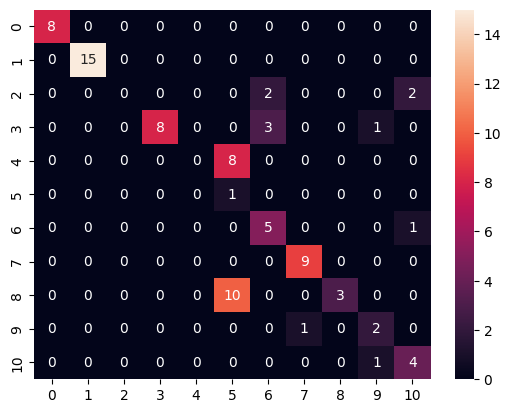

In [ ]:
sns.heatmap(cm, annot=True)

In [ ]:
stage_2_results_df = pd.read_csv('/content/drive/My Drive/capstone_personal/results/test_data_s2_results.csv')

In [ ]:
stage_2_results_df

,Unnamed: 0,true,pred
0,0,yes,Yes
1,1,yes,Yes
2,2,yes,Yes
3,3,yes,Yes
4,4,yes,Yes
...,...,...,...
79,79,no,No
80,80,no,No
81,81,no,No
82,82,no,No


In [ ]:
def binary_to_class(true, pred):

  true_class = []
  pred_class = []

  for i in range(len(true)):
    pred_str = pred[i].lower().strip(". ")
    true_str = true[i].lower().strip(". ")

    if pred_str == 'yes':
      pred_class.append(1)
    else:
      pred_class.append(0)

    if true_str == 'yes':
      true_class.append(1)
    else:
      true_class.append(0)

  return true_class, pred_class

In [ ]:
s2_true, s2_pred = binary_to_class(stage_2_results_df['true'].to_numpy(), stage_2_results_df['pred'].to_numpy())


In [ ]:
tp, fp, fn, tn, count = count_tp_fp(s2_true, s2_pred, 0)
print(tp, fp, fn, tn, count)

acc = (tp + tn) / (tp + tn + fp + fn)
if (tp + fp) == 0:
  prec = 0
else:
  prec = tp / (tp + fp)
if (tp + fn) == 0:
  rec = 0
else:
  rec = tp / (tp + fn)
if (prec + rec) == 0:
  f1 = 0
else:
  f1 = 2 * (prec * rec) / (prec + rec)

print('accuracy: ', acc)
print('precision: ', prec)
print('recall: ', rec)
print('f1: ', f1)

25 0 2 57 27
accuracy:  0.9761904761904762
precision:  1.0
recall:  0.9259259259259259
f1:  0.9615384615384615


In [ ]:
with open('/content/drive/My Drive/capstone_personal/rag_files/test_names_reference_list', 'rb') as dict_file:
    rag_embeddings = pickle.load(dict_file)

In [ ]:
encoder_model =SentenceTransformer('sentence-transformers/LaBSE')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/2.22k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/5.22M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.62M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

2_Dense/config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

In [ ]:
list_of_answers = ['box', 'can', 'candle', 'cardboard', 'coffee cup', 'cracker',
       'cracker box', 'cup', 'drink', 'drink can', 'food', 'glass bottle',
       'mason jar', 'milk', 'planter', 'plastic', 'plastic bag',
       'plastic bottle', 'plastic container', 'plastic cup', 'ramen',
       'root beer', 'soda can', 'styrofoam', 'tomato paste', 'water',
       'water bottle']

In [ ]:
for word in list_of_answers:

  reference_words_list = list(rag_embeddings.keys())
    # encoder_model = SentenceTransformer('sentence-transformers/LaBSE')
  reference_embeddings = encoder_model.encode(reference_words_list)

  knn_model = NearestNeighbors(n_neighbors=1)
  knn_model.fit(reference_embeddings)

  query_phrase = word.lower()

  query_llava = encoder_model.encode(query_phrase)

  dists, idxs = knn_model.kneighbors([query_llava])

    # print(idxs)
  neighbor = reference_words_list[idxs[0][0]]

  distance = dists[0]

  print(word, neight)


box box [5.04443392e-07]
can tin can [0.83007908]
candle tin can [0.97242761]
cardboard cardboard [4.90155344e-07]
coffee cup coffee cup [2.44169968e-07]
cracker cereal box [0.98312497]
cracker box cereal box [0.68177032]
cup coffee cup [0.62668127]
drink beverage can [0.7154808]
drink can beverage can [0.33890286]
food canned food can [0.93372524]
glass bottle glass bottle [5.1349582e-07]
mason jar cereal box [0.83422595]
milk milk jug [0.57762885]
planter box [1.08150971]
plastic thin plastic [0.62772137]
plastic bag plastic bag [4.90381808e-07]
plastic bottle plastic bottle [5.20048388e-07]
plastic container plastic takeout container [0.42903963]
plastic cup plastic cup [2.52001513e-07]
ramen aluminum can [1.11267817]
root beer beer bottle [0.70589978]
soda can soda can [2.71716459e-07]
styrofoam styrofoam cup [0.68018985]
tomato paste pepsi can [1.03332222]
water water bottle [0.70036995]
water bottle water bottle [5.79997902e-07]


In [ ]:
input_img = Image.open('/content/drive/My Drive/capstone_personal/test_images/plastic_cup/IMG_8322.jpg')

In [ ]:
instruction = """Examples of acceptable plastic items in mixed recycling bin: Plastic drink bottles, milk jugs, yogurt cups, tubs and lids, and shampoo bottles.
Details on plastic cups, recycle clear plastic cups in mixed recycling bin only. Colored plastic cups should go in the trash bin.
Before recycling, make sure everything is clean and dry.
"""

In [ ]:
# load in model

model_id = "llava-hf/llava-1.5-7b-hf"

processor = AutoProcessor.from_pretrained(model_id)

model = LlavaForConditionalGeneration.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    low_cpu_mem_usage=True,
    load_in_4bit=True
  )

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


processor_config.json:   0%|          | 0.00/173 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/701 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/505 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.45k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/41.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

Some kwargs in processor config are unused and will not have any effect: num_additional_image_tokens. 


config.json:   0%|          | 0.00/950 [00:00<?, ?B/s]

The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.


model.safetensors.index.json:   0%|          | 0.00/70.1k [00:00<?, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/4.18G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

In [ ]:
stage_2 = 'yes'
stage_3_name = 'plastic cup'

prompt = f"""USER: <image>\n Write recycling instructions for curbside recycling based upon the following information about local recycling in Boston, MA: {instruction}. Is this item able to be reyclced: {stage_2}. The descriptive name for the item is {stage_3_name}.
State in full sentences if this specific item can be recycled. Please provide instructions for how to recycle a {stage_3_name} in a recycling bin, create bulleted list instructions if it is recyclable, limit the answer to 2 short steps. Please be brief.\nASSISTANT:"""

inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

output = model.generate(**inputs, max_new_tokens=250, do_sample=False, temperature = 0)

output_str = processor.decode(output[0][2:], skip_special_tokens=True)

output_idx = output_str.index("ASSISTANT") + 11
stage_1 = output_str[output_idx:]
stage_1

'Yes, the plastic cup can be recycled. To recycle it, follow these steps:\n\n1. Empty the cup and rinse it thoroughly to remove any residue or leftover liquid.\n2. Place the cleaned cup in the mixed recycling bin along with other acceptable plastic items such as drink bottles, milk jugs, yogurt cups, tubs and lids, and shampoo bottles.\n\nNote: Colored plastic cups should go in the trash bin. Before recycling, make sure everything is clean and dry.'

In [ ]:
input_img = Image.open('/content/drive/My Drive/capstone_personal/test_images/aluminum_img.jpg')

In [ ]:
stage_2 = 'yes'
stage_3_name = 'plastic cup'

prompt = f"USER: <image>\nWhat is this waste item, what is it made of and primarily used for, don't consider the brand, output a short one phrase answer\nASSISTANT:"

inputs = processor(prompt, input_img, return_tensors='pt').to(0, torch.float16)

output = model.generate(**inputs, max_new_tokens=50, do_sample=False, temperature = 0)

output_str = processor.decode(output[0][2:], skip_special_tokens=True)

output_idx = output_str.index("ASSISTANT") + 11
stage_1 = output_str[output_idx:]
stage_1

/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:590: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(


'Aluminum foil'

### scratch cells (just ignored everything below)

In [ ]:
loc_name

2

In [ ]:
locations_json_idx_dict

{'Cook County': 1, 'Palm Desert': 2}

In [ ]:
x_data

[array([[[ 27,  34,  33],
         [ 37,  40,  39],
         [ 37,  37,  37],
         ...,
         [ 48,  44,  41],
         [ 53,  49,  45],
         [ 64,  56,  54]],
 
        [[ 13,  32,  51],
         [  9,  28,  40],
         [  9,  28,  33],
         ...,
         [ 56,  51,  48],
         [ 58,  53,  50],
         [ 59,  52,  49]],
 
        [[ 10,  39,  72],
         [ 11,  38,  64],
         [  9,  35,  58],
         ...,
         [ 56,  51,  48],
         [ 59,  54,  51],
         [ 59,  52,  50]],
 
        ...,
 
        [[163, 146, 131],
         [153, 138, 123],
         [114,  97,  86],
         ...,
         [141, 116,  82],
         [138, 114,  80],
         [135, 111,  77]],
 
        [[128, 114,  99],
         [152, 136, 121],
         [149, 134, 119],
         ...,
         [142, 118,  84],
         [139, 115,  81],
         [135, 111,  77]],
 
        [[119, 105,  90],
         [160, 145, 129],
         [136, 122, 107],
         ...,
         [141, 116,  82],
  

In [ ]:
im = Image.open(test_im_file_path)

In [ ]:
test_im_file_path.endswith(".png")

True

In [ ]:
import cv2

In [ ]:
from skimage.transform import resize

In [ ]:
im.size

(658, 883)

In [ ]:
np.asarray(im)[:].shape

(883, 658, 4)

In [ ]:
im_3d = np.asarray(im)[:, :, :3]

array([[[ 29,  33,  37],
        [ 29,  33,  37],
        [ 29,  33,  37],
        ...,
        [ 32,  32,  30],
        [ 32,  32,  30],
        [ 32,  32,  30]],

       [[ 29,  33,  37],
        [ 29,  33,  37],
        [ 29,  33,  37],
        ...,
        [ 32,  32,  30],
        [ 32,  32,  30],
        [ 32,  32,  30]],

       [[ 29,  33,  37],
        [ 29,  33,  37],
        [ 29,  33,  37],
        ...,
        [ 32,  32,  30],
        [ 32,  32,  30],
        [ 32,  32,  30]],

       ...,

       [[ 29,  34,  29],
        [ 29,  34,  29],
        [ 29,  34,  29],
        ...,
        [153, 135, 113],
        [153, 134, 112],
        [156, 137, 115]],

       [[ 29,  34,  29],
        [ 29,  34,  29],
        [ 29,  34,  29],
        ...,
        [146, 129, 109],
        [145, 129, 108],
        [159, 143, 121]],

       [[ 37,  41,  37],
        [ 37,  41,  37],
        [ 37,  41,  37],
        ...,
        [ 40,  39,  37],
        [ 40,  39,  37],
        [ 40,  39,  37]]], dtype=uint8)
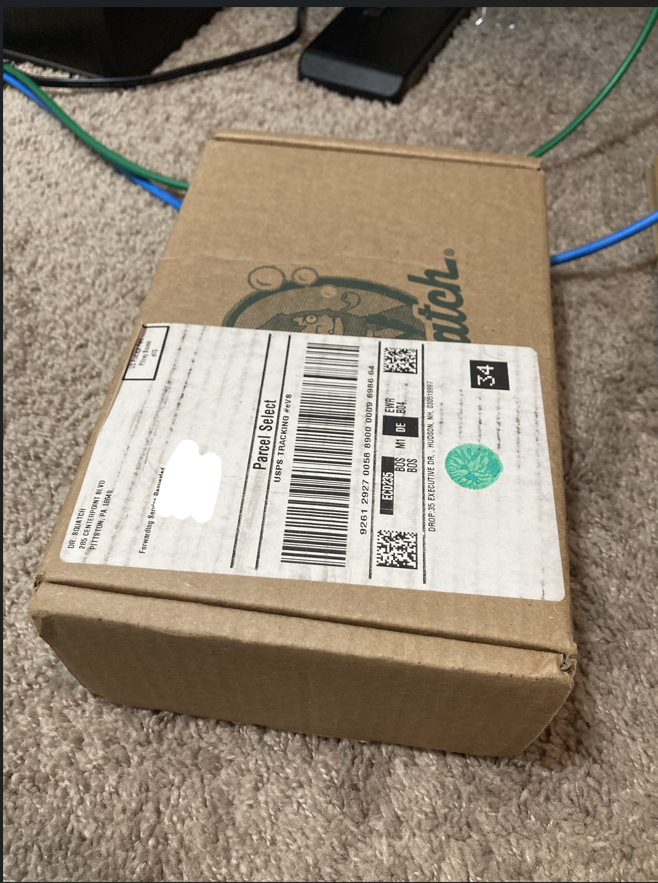

In [ ]:
im_3d

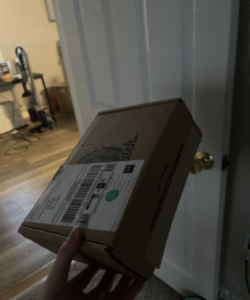

In [ ]:
Image.fromarray((resize(np.asarray(im), (300, 250, 3))*255).astype('uint8'))

In [ ]:
im_3d.shape

(883, 658, 3)

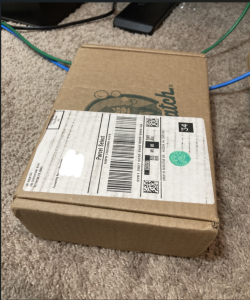

In [ ]:
Image.fromarray((resize(np.asarray(im_3d), (300, 250, 3))*255).astype('uint8'))

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)
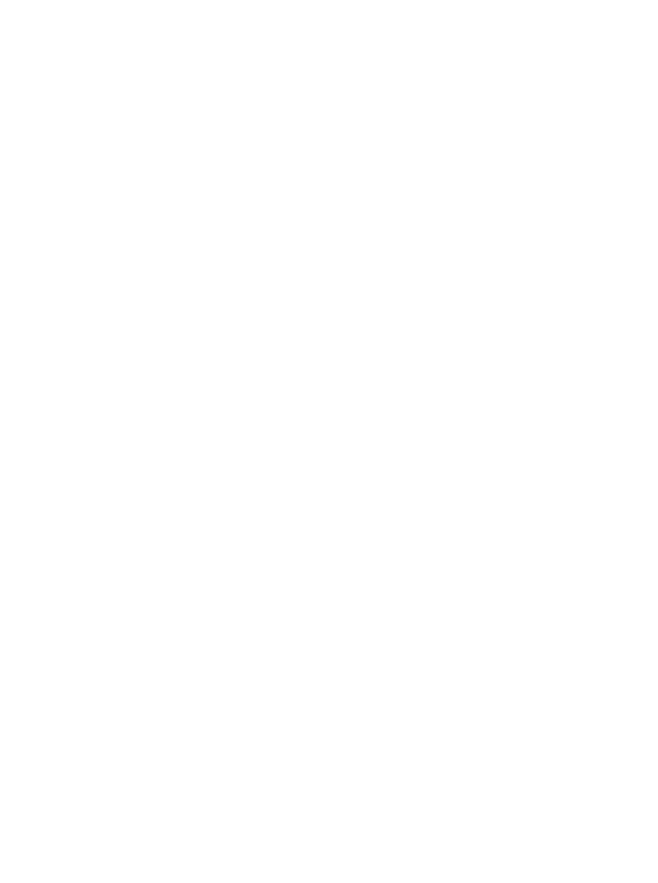

In [ ]:
im_3d

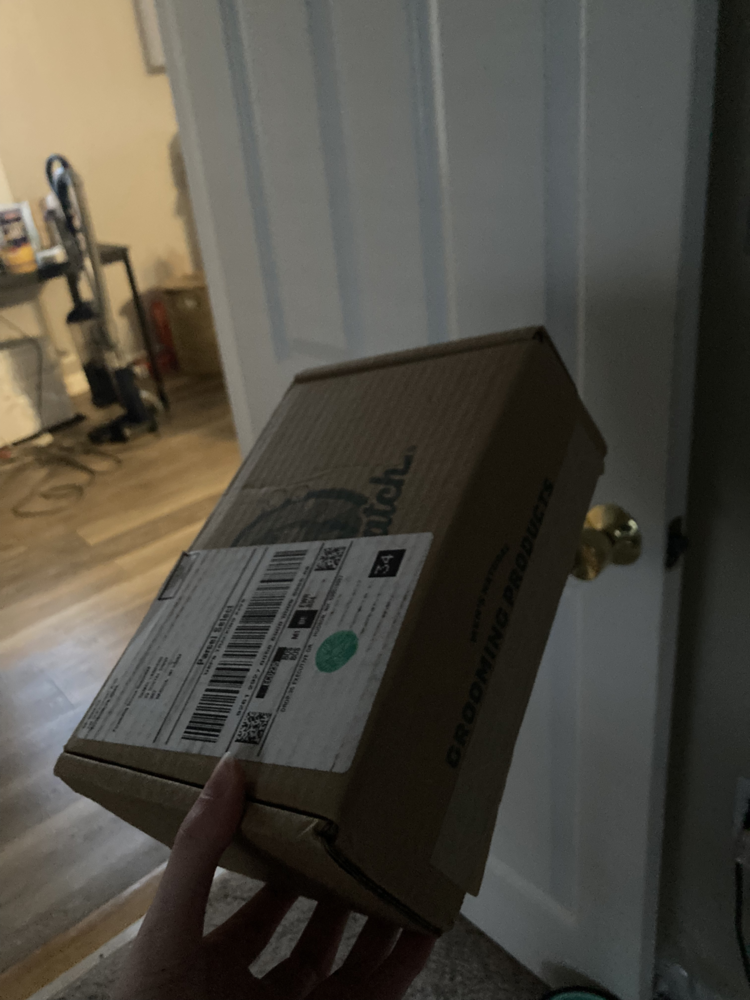

In [ ]:
Image.fromarray(cv2.GaussianBlur(np.asarray(im), (5, 5), 0))

In [ ]:
np.asarray(im)

array([[[204, 182, 145],
        [205, 183, 146],
        [206, 184, 145],
        ...,
        [ 33,  34,  28],
        [ 39,  40,  34],
        [ 36,  37,  31]],

       [[205, 183, 146],
        [205, 183, 146],
        [206, 184, 145],
        ...,
        [ 29,  30,  24],
        [ 33,  34,  28],
        [ 33,  34,  28]],

       [[205, 183, 146],
        [205, 183, 146],
        [205, 183, 144],
        ...,
        [ 32,  33,  27],
        [ 30,  31,  25],
        [ 31,  32,  26]],

       ...,

       [[ 61,  46,  25],
        [ 69,  54,  33],
        [ 77,  62,  41],
        ...,
        [ 39,  41,  36],
        [ 36,  38,  33],
        [ 35,  37,  32]],

       [[ 65,  53,  31],
        [ 68,  56,  34],
        [ 74,  59,  38],
        ...,
        [ 34,  36,  33],
        [ 40,  42,  39],
        [ 33,  35,  32]],

       [[ 71,  58,  39],
        [ 70,  58,  36],
        [ 72,  57,  36],
        ...,
        [ 37,  39,  36],
        [ 36,  38,  35],
        [ 35,  37,  34]]